In [322]:
from fastai.tabular.all import *

# Load the csv
df = pd.read_csv('./date_hood_thefts_filled.csv',
                 names=["date", "hood_id", "thefts"])
df.head()


,date,hood_id,thefts
0,2015-01-01,0,0
1,2015-01-01,1,0
2,2015-01-01,2,0
3,2015-01-01,3,0
4,2015-01-01,4,0


In [323]:
# Drop hood_id and group by date and sum thefts
df = df.drop(columns=['hood_id'])
df = df.groupby('date').sum()
df.head()

,thefts
date,
2015-01-01,0
2015-01-02,31
2015-01-03,17
2015-01-04,23
2015-01-05,22


<AxesSubplot: xlabel='date'>

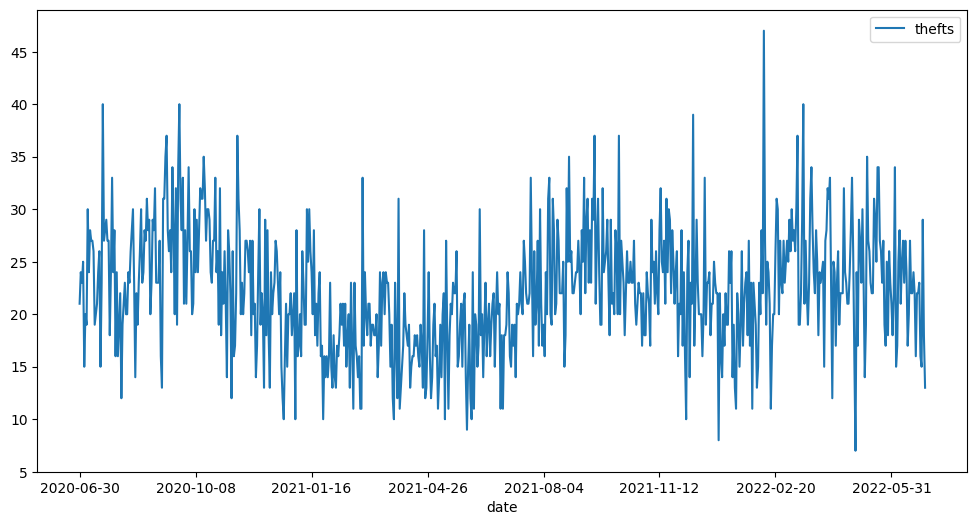

In [324]:
# Plot thefts by the last 2 years
df[-730:].plot(figsize=(12, 6))


<AxesSubplot: xlabel='date'>

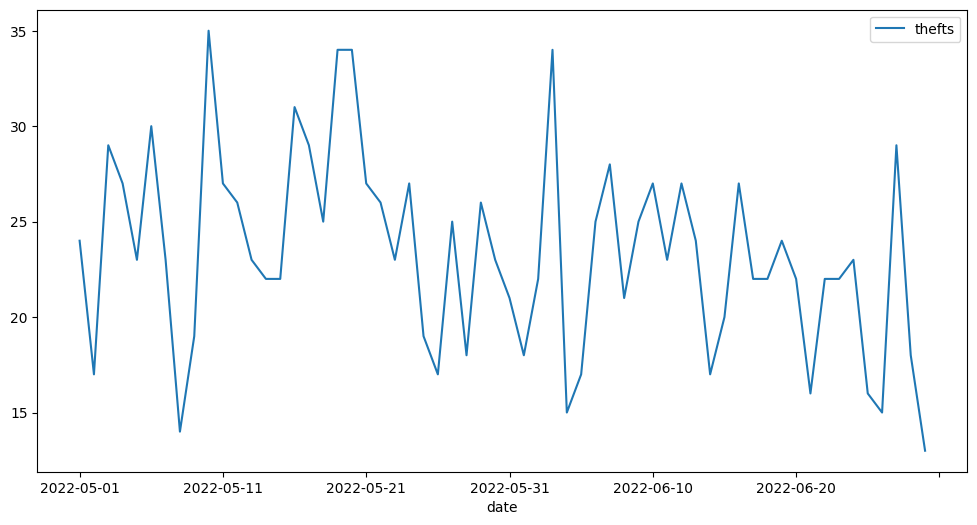

In [325]:
# Plot thefts by the last 2 months
df[-60:].plot(figsize=(12, 6))

In [326]:
# Get the last date in the dataset
from datetime import datetime


last_date = df.index[-1]
# Convert the last date to a datetime object

last_date = datetime.strptime(last_date, '%Y-%m-%d')
last_date

datetime.datetime(2022, 6, 29, 0, 0)

In [327]:
from datetime import timedelta

# Create a dataframe for predictions
df_predictions = pd.DataFrame()

# Loop through the next 350 days starting from the last date
for i in range(1, 350):
  # Create a new date
  new_date = last_date + timedelta(days=i)
  # Loop from 0 to 158
  for hood_id in range(0, 159):
    # Add the new date and hood_id to the dataframe
    df_predictions = df_predictions.append({'date': new_date, 'hood_id': hood_id}, ignore_index=True)

df_predictions.head()

/var/folders/7b/0z013d0x38n5dm8l78sg1z_m0000gn/T/ipykernel_79184/2712154135.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_predictions = df_predictions.append({'date': new_date, 'hood_id': hood_id}, ignore_index=True)
/var/folders/7b/0z013d0x38n5dm8l78sg1z_m0000gn/T/ipykernel_79184/2712154135.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_predictions = df_predictions.append({'date': new_date, 'hood_id': hood_id}, ignore_index=True)
/var/folders/7b/0z013d0x38n5dm8l78sg1z_m0000gn/T/ipykernel_79184/2712154135.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_predictions = df_predictions.append({'date': new_date, 'hood_id': hood_id}, ignore_index=True)
/var/folders/7b/0z013d0x38n5dm8l78sg1z_m0000gn/T/ipy

,date,hood_id
0,2022-06-30,0
1,2022-06-30,1
2,2022-06-30,2
3,2022-06-30,3
4,2022-06-30,4


In [328]:
# Transform the date column to a datetime object
make_date(df_predictions, 'date')
df_predictions.head()


,date,hood_id
0,2022-06-30,0
1,2022-06-30,1
2,2022-06-30,2
3,2022-06-30,3
4,2022-06-30,4


In [329]:
# Feature engineer the date column
add_datepart(df_predictions, 'date', drop=False)
df_predictions.head()


,date,hood_id,Year,Month,Week,Day,Dayofweek,Dayofyear,Is_month_end,Is_month_start,Is_quarter_end,Is_quarter_start,Is_year_end,Is_year_start,Elapsed
0,2022-06-30,0,2022,6,26,30,3,181,True,False,True,False,False,False,1.656547e+09
1,2022-06-30,1,2022,6,26,30,3,181,True,False,True,False,False,False,1.656547e+09
2,2022-06-30,2,2022,6,26,30,3,181,True,False,True,False,False,False,1.656547e+09
3,2022-06-30,3,2022,6,26,30,3,181,True,False,True,False,False,False,1.656547e+09
4,2022-06-30,4,2022,6,26,30,3,181,True,False,True,False,False,False,1.656547e+09


In [330]:
# Load the exported model
learn = load_learner('./exported_models/74_fill_imbalance.pkl')

In [331]:
# Get the predictions
row, clas, probs = learn.predict(df_predictions.iloc[10])
row, clas, probs


(   hood_id  Month  Week   Day  Dayofweek  Dayofyear  Is_month_end  \
 0     11.0    6.0  26.0  30.0        4.0      181.0           2.0   
 
    Is_month_start  Is_quarter_end  Is_quarter_start  Is_year_end  \
 0             1.0             2.0               1.0          1.0   
 
    Is_year_start      Year  thefts  
 0            1.0  2.622102     0.0  ,
 tensor(0),
 tensor([6.6474e-01, 3.2970e-01, 4.7627e-03, 5.2847e-04, 2.3437e-04, 3.6448e-05]))

In [332]:
# Create new dataframe for predictions
predictions_new = []

# Loop through the predictions and add the predictions to the dataframe
for i in range(0, len(df_predictions)):
  with learn.no_bar(), learn.no_logging():
    row, clas, probs = learn.predict(df_predictions.iloc[i])
  predictions_new.append(int(clas))

In [333]:
# Merge predictions array with the dataframe and rename the column to thefts
df_predictions['thefts'] = predictions_new

df_predictions.head()


,date,hood_id,Year,Month,Week,Day,Dayofweek,Dayofyear,Is_month_end,Is_month_start,Is_quarter_end,Is_quarter_start,Is_year_end,Is_year_start,Elapsed,thefts
0,2022-06-30,0,2022,6,26,30,3,181,True,False,True,False,False,False,1.656547e+09,0
1,2022-06-30,1,2022,6,26,30,3,181,True,False,True,False,False,False,1.656547e+09,1
2,2022-06-30,2,2022,6,26,30,3,181,True,False,True,False,False,False,1.656547e+09,0
3,2022-06-30,3,2022,6,26,30,3,181,True,False,True,False,False,False,1.656547e+09,0
4,2022-06-30,4,2022,6,26,30,3,181,True,False,True,False,False,False,1.656547e+09,0


In [334]:
# Drop all columns except pred_thefts and Elapsed
df_predictions = df_predictions.drop(columns=['Year', 'Month', 'Week', 'Day', 'Dayofweek', 'Dayofyear', 'Is_month_end',
                                     'Is_month_start', 'Is_quarter_end', 'Is_quarter_start', 'Is_year_end', 'Is_year_start', 'hood_id', 'Elapsed'])

# Group by date and sum the thefts
df_predictions = df_predictions.groupby('date').sum()

In [335]:
df_predictions.head()

,thefts
date,
2022-06-30,10
2022-07-01,13
2022-07-02,13
2022-07-03,18
2022-07-04,18


<AxesSubplot: xlabel='date'>

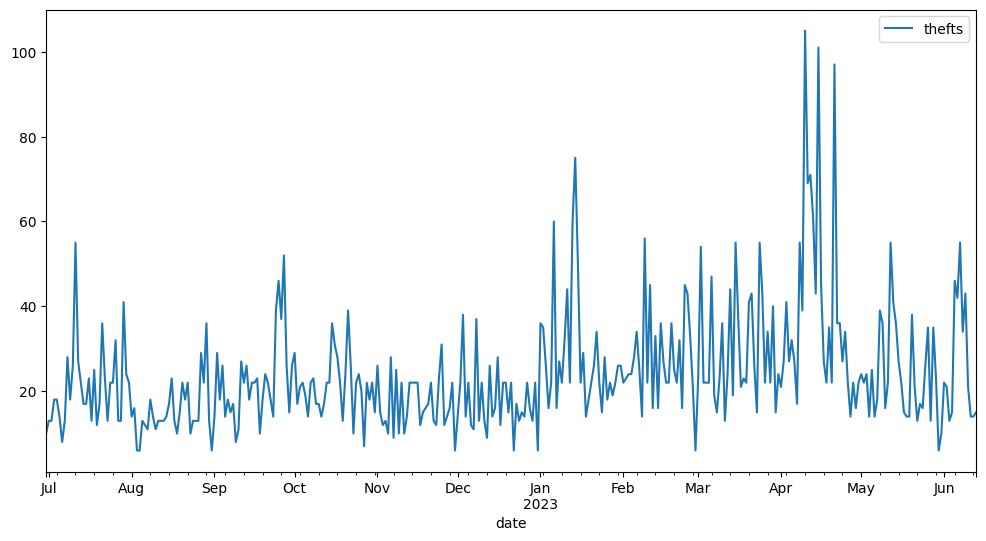

In [336]:
# Plot the predictions
df_predictions.plot(figsize=(12, 6))

In [337]:
# Convert date column to a datetime object
df_predictions.index = pd.to_datetime(df_predictions.index)
df.index = pd.to_datetime(df.index)


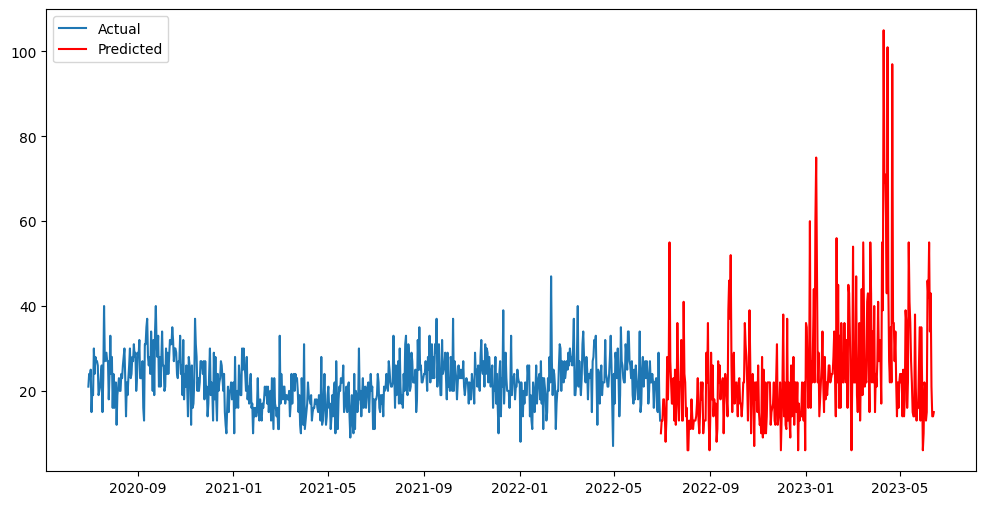

In [338]:
# Use matplotlib to plot df and df_predictions on the same graph
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(df[-730:], label='Actual')
plt.plot(df_predictions, label='Predicted', color='red')
plt.legend()
plt.show()

In [339]:
# Save the predictions to a csv
df_predictions.to_csv('./next_year_predictions.csv')